<a href="https://colab.research.google.com/github/raulpoppiel/geemap/blob/master/04_hydricBalance_data_monthly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><font color="green" size="6"> <b>Sugarcane Yield Prediction using RS and ML<b> </font></center>
<center><img src="https://www.omex.com/wp-content/uploads/2020/10/Sugar-Cane-Harvest-1536x772.jpg" height="150"></center>

---

_Script elaborated by **Raul Roberto Poppiel**_ ([raulpoppiel@gmail.com](raulpoppiel@gmail.com)) for the [FAPESP](https://fapesp.br/en) project Nº [23/01062-1](https://bv.fapesp.br/en/bolsas/207973/satellite-imagery-and-machine-learning-for-sugarcane-yield-estimation-in-regions-of-sao-paulo-state/), led by Professor Ana Claudia dos Santos Luciano (analuciano@usp.br) from ESALQ/USP, Brazil. The methodology employed was developed by Rafaella Pironato Amaro and is detailed in the document titled [Estimativa de produtividade da cana-de-açúcar a partir de imagens do satélite Sentinel-2A e o algoritmo de aprendizagem de máquina Random Forest](https://doi.org/10.11606/D.11.2023.tde-02102023-163947).

### Install and import tools

Data science modules

In [ ]:
# Load modules
import os
import pandas as pd
import numpy as np
import time
from pathlib import Path

print('Modules loaded')

Modules loaded


### Connect to GDrive

In [ ]:
# Connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Set GDrive paths

Define the output folders in GD

In [ ]:
# Define folder names
folder_name_root = 'Colab Notebooks'
folder_name_project = '01_SugarcaneYieldPrediction'
folder_name_farm = 'usinas_all'
folder_name_specific = '04_hydricBalance_data_monthly'

# define your GEE username
username_gee = 'raulrpoppiel'

# Define sugarcane crop-season (SAFRA)
CropSeason = 1920 # 1920, 2021, 2122, 2223

In [ ]:
# Check if the folder exists or else create
root_path = f'/content/drive/MyDrive/{folder_name_root}'
project_path = f'{root_path}/{folder_name_project}'
farm_path = f'{project_path}/{folder_name_farm}'
out_path = f'{farm_path}/{folder_name_specific}' # your results will be stored in 'out_path'

if not os.path.exists(out_path):
  Path(out_path).mkdir(parents=True, exist_ok=True)
  print("Output directory created successfully.")
else:
  print("Output directory already exists.")

os.chdir(out_path)
print(os.getcwd(),'\n')  # Print the current working directory
pd.DataFrame(os.listdir(), columns=['List files'])  # List files and directories in the current directory

Output directory already exists.
/content/drive/MyDrive/Colab Notebooks/01_SugarcaneYieldPrediction/02_usinas_all/04_hydricBalance_data_monthly 

List of files:
                                           Files
0  04_HydricBalance_data_monthly_safra_1920.csv
1  04_HydricBalance_data_monthly_safra_2021.csv
2  04_HydricBalance_data_monthly_safra_2122.csv


# Hydric Balance

<center>
<center><img src="https://blog.aegro.com.br/wp-content/uploads/2020/02/1-plantio-cana-ano-meio.png" height="450"></center>

## Daily climatic data

In [ ]:
# Import CSVs of stats by zone
daily_stats_path = f'{farm_path}/02_climatic_data_daily/02_climatic_data_daily_MEAN_safra_{CropSeason}_merged.csv'
T_P_ETP_daily_stats = pd.read_csv(daily_stats_path)

print(daily_stats_path,'\n')
print('Rows:',T_P_ETP_daily_stats.shape[0])
print('Columns:',T_P_ETP_daily_stats.shape[1],'\n')
T_P_ETP_daily_stats.head().style.set_caption('')

/content/drive/MyDrive/Colab Notebooks/01_SugarcaneYieldPrediction/02_usinas_all/02_climatic_data_daily/02_climatic_data_daily_MEAN_safra_2223_merged.csv 

Rows: 4815
Columns: 1363 



Compute kc_values

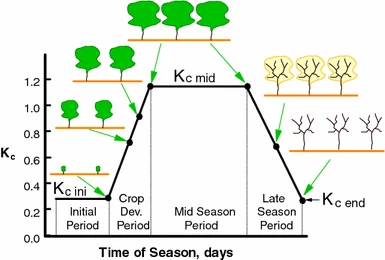

In [ ]:
%%capture

# Function to calculate Kc and ETc
def calculate_ETc(dataframe):
    dataframe_original = dataframe.copy()
    dataframe_original.set_index("ID_SIG", inplace=True)

    dataframe.set_index("ID_SIG", inplace=True)

    kc_columns = []  # List to store the Kc column names

    # Step 1: Extract date from column header in the format YYYYMMDD
    dates = [col[:8] for col in dataframe.columns if col.endswith('_ETP')]

    # Define the Julian day ranges and their corresponding Kc values
    kc_values = {
        (105, 135): 0.5,
        (136, 165): 0.8,
        (166, 180): 0.95,
        (181, 230): 1.1,
        (231, 365): 1.2,
        (1,    45): 0.9,
        (46,   75): 0.85,
        (76,  104): 0.7
    }

    for date in dates:
        kc_col_name = date + '_Kc'
        kc_columns.append(kc_col_name)
        dataframe[kc_col_name] = 0.8  # Default Kc value

        # Step 2: Calculate crop coefficient (Kc) according to Julian days
        dataframe[date + '_JulianDay'] = int(pd.to_datetime(date, format='%Y%m%d').strftime('%j'))

        # Convert 'JulianDay' column to integer
        dataframe[date + '_JulianDay'] = dataframe[date + '_JulianDay'].astype(int)

        # Iterate over the kc_values dictionary and update Kc values based on Julian day ranges
        for day_range, kc_value in kc_values.items():
            start_day, end_day = day_range
            condition = np.logical_and(dataframe[date + '_JulianDay'] >= start_day, dataframe[date + '_JulianDay'] <= end_day)
            dataframe.loc[condition, kc_col_name] = kc_value

        # Step 3: Multiply Kc with potential evapotranspiration (ETP)
        etp_col_name = date + '_ETP'
        dataframe[date + '_ETc'] = dataframe[kc_col_name] * dataframe[etp_col_name]

    # Step 4: Concatenate dataframes by rows using "ID_SIG" as index
    dataframes_to_concat = dataframe_original.combine_first(dataframe)

    # Step 5: Return dataframe with Kc and ETc columns
    return dataframes_to_concat

# Apply function
dataframe_to_use = T_P_ETP_daily_stats.copy()

T_P_ETP_daily_stats_etc = calculate_ETc(dataframe_to_use)
# T_P_ETP_daily_stats_etc = T_P_ETP_daily_stats_etc.drop_duplicates()

# Create a new column with index values
T_P_ETP_daily_stats_etc['ID_SIG'] = T_P_ETP_daily_stats_etc.index

In [ ]:
# Display results
print('Rows:',T_P_ETP_daily_stats_etc.shape[0])
print('Columns:',T_P_ETP_daily_stats_etc.shape[1],'\n')

T_P_ETP_daily_stats_etc.head().style.set_caption('')

Rows: 4815
Columns: 2725 



,20210101_ETP,20210101_ETc,20210101_JulianDay,20210101_Kc,20210101_temperature_2m,20210101_total_precipitation_sum,20210102_ETP,20210102_ETc,20210102_JulianDay,20210102_Kc,20210102_temperature_2m,20210102_total_precipitation_sum,20210103_ETP,20210103_ETc,20210103_JulianDay,20210103_Kc,20210103_temperature_2m,20210103_total_precipitation_sum,20210104_ETP,20210104_ETc,20210104_JulianDay,20210104_Kc,20210104_temperature_2m,20210104_total_precipitation_sum,20210105_ETP,20210105_ETc,20210105_JulianDay,20210105_Kc,20210105_temperature_2m,20210105_total_precipitation_sum,20210106_ETP,20210106_ETc,20210106_JulianDay,20210106_Kc,20210106_temperature_2m,20210106_total_precipitation_sum,20210107_ETP,20210107_ETc,20210107_JulianDay,20210107_Kc,20210107_temperature_2m,20210107_total_precipitation_sum,20210108_ETP,20210108_ETc,20210108_JulianDay,20210108_Kc,20210108_temperature_2m,20210108_total_precipitation_sum,20210109_ETP,20210109_ETc,20210109_JulianDay,20210109_Kc,20210109_temperature_2m,20210109_total_precipitation_sum,20210110_ETP,20210110_ETc,20210110_JulianDay,20210110_Kc,20210110_temperature_2m,20210110_total_precipitation_sum,20210111_ETP,20210111_ETc,20210111_JulianDay,20210111_Kc,20210111_temperature_2m,20210111_total_precipitation_sum,20210112_ETP,20210112_ETc,20210112_JulianDay,20210112_Kc,20210112_temperature_2m,20210112_total_precipitation_sum,20210113_ETP,20210113_ETc,20210113_JulianDay,20210113_Kc,20210113_temperature_2m,20210113_total_precipitation_sum,20210114_ETP,20210114_ETc,20210114_JulianDay,20210114_Kc,20210114_temperature_2m,20210114_total_precipitation_sum,20210115_ETP,20210115_ETc,20210115_JulianDay,20210115_Kc,20210115_temperature_2m,20210115_total_precipitation_sum,20210116_ETP,20210116_ETc,20210116_JulianDay,20210116_Kc,20210116_temperature_2m,20210116_total_precipitation_sum,20210117_ETP,20210117_ETc,20210117_JulianDay,20210117_Kc,20210117_temperature_2m,20210117_total_precipitation_sum,20210118_ETP,20210118_ETc,20210118_JulianDay,20210118_Kc,20210118_temperature_2m,20210118_total_precipitation_sum,20210119_ETP,20210119_ETc,20210119_JulianDay,20210119_Kc,20210119_temperature_2m,20210119_total_precipitation_sum,20210120_ETP,20210120_ETc,20210120_JulianDay,20210120_Kc,20210120_temperature_2m,20210120_total_precipitation_sum,20210121_ETP,20210121_ETc,20210121_JulianDay,20210121_Kc,20210121_temperature_2m,20210121_total_precipitation_sum,20210122_ETP,20210122_ETc,20210122_JulianDay,20210122_Kc,20210122_temperature_2m,20210122_total_precipitation_sum,20210123_ETP,20210123_ETc,20210123_JulianDay,20210123_Kc,20210123_temperature_2m,20210123_total_precipitation_sum,20210124_ETP,20210124_ETc,20210124_JulianDay,20210124_Kc,20210124_temperature_2m,20210124_total_precipitation_sum,20210125_ETP,20210125_ETc,20210125_JulianDay,20210125_Kc,20210125_temperature_2m,20210125_total_precipitation_sum,20210126_ETP,20210126_ETc,20210126_JulianDay,20210126_Kc,20210126_temperature_2m,20210126_total_precipitation_sum,20210127_ETP,20210127_ETc,20210127_JulianDay,20210127_Kc,20210127_temperature_2m,20210127_total_precipitation_sum,20210128_ETP,20210128_ETc,20210128_JulianDay,20210128_Kc,20210128_temperature_2m,20210128_total_precipitation_sum,20210129_ETP,20210129_ETc,20210129_JulianDay,20210129_Kc,20210129_temperature_2m,20210129_total_precipitation_sum,20210130_ETP,20210130_ETc,20210130_JulianDay,20210130_Kc,20210130_temperature_2m,20210130_total_precipitation_sum,20210131_ETP,20210131_ETc,20210131_JulianDay,20210131_Kc,20210131_temperature_2m,20210131_total_precipitation_sum,20210201_ETP,20210201_ETc,20210201_JulianDay,20210201_Kc,20210201_temperature_2m,20210201_total_precipitation_sum,20210202_ETP,20210202_ETc,20210202_JulianDay,20210202_Kc,20210202_temperature_2m,20210202_total_precipitation_sum,20210203_ETP,20210203_ETc,20210203_JulianDay,20210203_Kc,20210203_temperature_2m,20210203_total_precipitation_sum,20210204_ETP,20210204_ETc,20210204_JulianDay,20210204_Kc,20210204_temperature_2m,20210204_total_precipitation_sum,20210205_

## Daily P-ETc

In [ ]:
%%capture

# Function to calculate P-ETc
def calculate_P_ETc(dataframe):
    dataframe_original = dataframe.copy()
    dataframe_original.set_index("ID_SIG", inplace=True)

    dataframe.set_index("ID_SIG", inplace=True)

    # Step 1: Extract date from column header in the format YYYYMMDD
    dates = [col[:8] for col in dataframe.columns if col.endswith('_ETc')]

    for date in dates:
        etc_col_name = date + '_ETc'
        precip_col_name = date + '_total_precipitation_sum'

        # Step 2: Calculate DEF by subtracting ETc from total precipitation
        dataframe[date + '_P_ETc'] = dataframe[precip_col_name] - dataframe[etc_col_name]

    # Step 3: Concatenate dataframes by rows using "ID_SIG" as index
    dataframes_to_concat = dataframe_original.combine_first(dataframe)

    # Step 4: Return dataframe with DEF column
    return dataframes_to_concat

# Apply function
dataframe_to_use_def = T_P_ETP_daily_stats_etc.copy()

T_P_ETP_ETc_Kc_pETc_daily = calculate_P_ETc(dataframe_to_use_def)
# T_P_ETP_ETc_Kc_pETc_daily = T_P_ETP_ETc_Kc_pETc_daily.drop_duplicates()

# Create a new column with index values
T_P_ETP_ETc_Kc_pETc_daily['ID_SIG'] = T_P_ETP_ETc_Kc_pETc_daily.index

In [ ]:
# Display results
print('Rows:',T_P_ETP_ETc_Kc_pETc_daily.shape[0])
print('Columns:',T_P_ETP_ETc_Kc_pETc_daily.shape[1],'\n')

T_P_ETP_ETc_Kc_pETc_daily.head().style.set_caption('')

Rows: 4815
Columns: 3179 



,20210101_ETP,20210101_ETc,20210101_JulianDay,20210101_Kc,20210101_P_ETc,20210101_temperature_2m,20210101_total_precipitation_sum,20210102_ETP,20210102_ETc,20210102_JulianDay,20210102_Kc,20210102_P_ETc,20210102_temperature_2m,20210102_total_precipitation_sum,20210103_ETP,20210103_ETc,20210103_JulianDay,20210103_Kc,20210103_P_ETc,20210103_temperature_2m,20210103_total_precipitation_sum,20210104_ETP,20210104_ETc,20210104_JulianDay,20210104_Kc,20210104_P_ETc,20210104_temperature_2m,20210104_total_precipitation_sum,20210105_ETP,20210105_ETc,20210105_JulianDay,20210105_Kc,20210105_P_ETc,20210105_temperature_2m,20210105_total_precipitation_sum,20210106_ETP,20210106_ETc,20210106_JulianDay,20210106_Kc,20210106_P_ETc,20210106_temperature_2m,20210106_total_precipitation_sum,20210107_ETP,20210107_ETc,20210107_JulianDay,20210107_Kc,20210107_P_ETc,20210107_temperature_2m,20210107_total_precipitation_sum,20210108_ETP,20210108_ETc,20210108_JulianDay,20210108_Kc,20210108_P_ETc,20210108_temperature_2m,20210108_total_precipitation_sum,20210109_ETP,20210109_ETc,20210109_JulianDay,20210109_Kc,20210109_P_ETc,20210109_temperature_2m,20210109_total_precipitation_sum,20210110_ETP,20210110_ETc,20210110_JulianDay,20210110_Kc,20210110_P_ETc,20210110_temperature_2m,20210110_total_precipitation_sum,20210111_ETP,20210111_ETc,20210111_JulianDay,20210111_Kc,20210111_P_ETc,20210111_temperature_2m,20210111_total_precipitation_sum,20210112_ETP,20210112_ETc,20210112_JulianDay,20210112_Kc,20210112_P_ETc,20210112_temperature_2m,20210112_total_precipitation_sum,20210113_ETP,20210113_ETc,20210113_JulianDay,20210113_Kc,20210113_P_ETc,20210113_temperature_2m,20210113_total_precipitation_sum,20210114_ETP,20210114_ETc,20210114_JulianDay,20210114_Kc,20210114_P_ETc,20210114_temperature_2m,20210114_total_precipitation_sum,20210115_ETP,20210115_ETc,20210115_JulianDay,20210115_Kc,20210115_P_ETc,20210115_temperature_2m,20210115_total_precipitation_sum,20210116_ETP,20210116_ETc,20210116_JulianDay,20210116_Kc,20210116_P_ETc,20210116_temperature_2m,20210116_total_precipitation_sum,20210117_ETP,20210117_ETc,20210117_JulianDay,20210117_Kc,20210117_P_ETc,20210117_temperature_2m,20210117_total_precipitation_sum,20210118_ETP,20210118_ETc,20210118_JulianDay,20210118_Kc,20210118_P_ETc,20210118_temperature_2m,20210118_total_precipitation_sum,20210119_ETP,20210119_ETc,20210119_JulianDay,20210119_Kc,20210119_P_ETc,20210119_temperature_2m,20210119_total_precipitation_sum,20210120_ETP,20210120_ETc,20210120_JulianDay,20210120_Kc,20210120_P_ETc,20210120_temperature_2m,20210120_total_precipitation_sum,20210121_ETP,20210121_ETc,20210121_JulianDay,20210121_Kc,20210121_P_ETc,20210121_temperature_2m,20210121_total_precipitation_sum,20210122_ETP,20210122_ETc,20210122_JulianDay,20210122_Kc,20210122_P_ETc,20210122_temperature_2m,20210122_total_precipitation_sum,20210123_ETP,20210123_ETc,20210123_JulianDay,20210123_Kc,20210123_P_ETc,20210123_temperature_2m,20210123_total_precipitation_sum,20210124_ETP,20210124_ETc,20210124_JulianDay,20210124_Kc,20210124_P_ETc,20210124_temperature_2m,20210124_total_precipitation_sum,20210125_ETP,20210125_ETc,20210125_JulianDay,20210125_Kc,20210125_P_ETc,20210125_temperature_2m,20210125_total_precipitation_sum,20210126_ETP,20210126_ETc,20210126_JulianDay,20210126_Kc,20210126_P_ETc,20210126_temperature_2m,20210126_total_precipitation_sum,20210127_ETP,20210127_ETc,20210127_JulianDay,20210127_Kc,20210127_P_ETc,20210127_temperature_2m,20210127_total_precipitation_sum,20210128_ETP,20210128_ETc,20210128_JulianDay,20210128_Kc,20210128_P_ETc,20210128_temperature_2m,20210128_total_precipitation_sum,20210129_ETP,20210129_ETc,20210129_JulianDay,20210129_Kc,20210129_P_ETc,20210129_temperature_2m,20210129_total_precipitation_sum,20210130_ETP,20210130_ETc,20210130_JulianDay,20210130_Kc,20210130_P_ETc,20210130_temperature_2m,20210130_total_precipitation_sum,20210131_ETP,20210131_ETc,20210131_JulianDay,20210131_Kc,20210131_P_ETc,20210131_temperature_2m,20210131_total_precipitation_sum,

## Daily NAc and ARM

CAD (specific for each sugarcane mill)

In [ ]:
# Setting CAD values according to the ID_SIG of the sugarcane mill

def assign_cad_values(df):
    # Create a copy of the DataFrame to avoid modifying the original data
    df_copy = df.copy()

    # Create a dictionary to map IDSIG values to CAD values (in mm)
    cad_mapping = {
        "002": 66,
        "028": 66,
        "072": 85,
        "139": 60,
        "140": 95,
        "089": 75
        #Adicionar aqui novos valores de CAD para novas Usinas
    }

    # Assign CAD values based on IDSIG
    df_copy['CAD'] = df_copy['ID_SIG'].str[5:8].map(cad_mapping)

    return df_copy

T_P_ETP_ETc_Kc_pETc_CAD_daily = assign_cad_values(T_P_ETP_ETc_Kc_pETc_daily)

In [ ]:
print('Rows:',T_P_ETP_ETc_Kc_pETc_CAD_daily.shape[0])
print('Columns:',T_P_ETP_ETc_Kc_pETc_CAD_daily.shape[1],'\n')

T_P_ETP_ETc_Kc_pETc_CAD_daily.head()

Rows: 4815
Columns: 3180 



,20210101_ETP,20210101_ETc,20210101_JulianDay,20210101_Kc,20210101_P_ETc,20210101_temperature_2m,20210101_total_precipitation_sum,20210102_ETP,20210102_ETc,20210102_JulianDay,...,20220329_total_precipitation_sum,20220330_ETP,20220330_ETc,20220330_JulianDay,20220330_Kc,20220330_P_ETc,20220330_temperature_2m,20220330_total_precipitation_sum,ID_SIG,CAD
ID_SIG,,,,,,,,,,,,,,,,,,,,,
X22230280001000100000030,2.476018,2.228417,1,0.9,8.744471,22.554862,10.972887,5.298463,4.768617,2,...,0.367367,4.293047,3.005133,89,0.7,-0.716046,25.236740,2.289087,X22230280001000100000030,66
X22230280001001200000006,2.476018,2.228417,1,0.9,8.744471,22.554862,10.972887,5.298463,4.768617,2,...,0.367367,4.293047,3.005133,89,0.7,-0.716046,25.236740,2.289087,X22230280001001200000006,66
X22230280001001200000007,2.476018,2.228417,1,0.9,8.744471,22.554862,10.972887,5.298463,4.768617,2,...,0.367367,4.293047,3.005133,89,0.7,-0.716046,25.236740,2.289087,X22230280001001200000007,66
X22230280001001200000011,2.476018,2.228417,1,0.9,8.744471,22.554862,10.972887,5.298463,4.768617,2,...,0.367367,4.293047,3.005133,89,0.7,-0.716046,25.236740,2.289087,X22230280001001200000011,66
X22230280001001500000022,2.620932,2.358839,1,0.9,9.161934,22.476818,11.520773,5.305344,4.774810,2,...,0.286424,4.296685,3.007680,89,0.7,-1.268073,25.034103,1.739606,X22230280001001500000022,66


Set initial values at 1st and 2nd days

In [ ]:
# Define the real period in years
if CropSeason == 1920:
    SrtYear = '2018'
    EndYear = '2019'
elif CropSeason == 2021:
    SrtYear = '2019'
    EndYear = '2020'
elif CropSeason == 2122:
    SrtYear = '2020'
    EndYear = '2021'
elif CropSeason == 2223:
    SrtYear = '2021'
    EndYear = '2022'
elif CropSeason == 2324:
    SrtYear = '2022'
    EndYear = '2023'
else:
    # Handle unknown CropSeason values
    print("Unknown CropSeason")

# Example:
# SAFRA_real = SAFRA - 1
SrtYear_real = str(int(SrtYear) - 1)
EndYear_real = str(int(EndYear) - 1)

# Display the results
print(f"Start: 01/04/{SrtYear} --> Real: 01/04/{SrtYear_real}")
print(f"End: 31/03/{EndYear} --> Real: 31/03/{EndYear_real}")

Start: 01/04/2021 --> Real: 01/04/2020
End: 31/03/2022 --> Real: 31/03/2021


In [ ]:
# Function to calculate Kc and ETc
def assign_values_01JD_02JD(df):
    dataframe = df.copy()
    CAD = dataframe['CAD']

    # Step 1: Extract date from column header in the format YYYYMMDD
    dates = [col[:8] for col in dataframe.columns if col.endswith('_ETP')]

    # Step 2: Set values manually for the first and second Julian Days
    # Asume-se que a caixa do solo esta cheia (o armazenamento é igual à capacidade que solo tem para armazenar água)
    for date in dates:
        if date == str(SrtYear + '0101'):
            dataframe[date + '_ARMi'] = CAD
            dataframe[date + '_ARMf'] = CAD
            dataframe[date + '_ALT'] = 0
            dataframe[date + '_Exc'] = dataframe[date + '_P_ETc']
            dataframe[date + '_NAC'] = 0
            dataframe[date + '_Def'] = 0
            dataframe[date + '_ETR'] = dataframe[date + '_ETc']
            dataframe[date + '_Def_rel'] = 0

        elif date == str(SrtYear + '0102'):
            dataframe[date + '_ARMi'] = CAD
            dataframe[date + '_ARMf'] = CAD
            dataframe[date + '_ALT'] = 0
            dataframe[date + '_Exc'] = dataframe[date + '_P_ETc']
            dataframe[date + '_NAC'] = 0
            dataframe[date + '_Def'] = 0
            dataframe[date + '_ETR'] = dataframe[date + '_ETc']
            dataframe[date + '_Def_rel'] = 0

    # Step 3: Return dataframe with values
    return dataframe

T_P_ETP_ETc_Kc_pETc_CAD_bh_daily = assign_values_01JD_02JD(T_P_ETP_ETc_Kc_pETc_CAD_daily)

In [ ]:
print('Rows:',T_P_ETP_ETc_Kc_pETc_CAD_bh_daily.shape[0])
print('Columns:',T_P_ETP_ETc_Kc_pETc_CAD_bh_daily.shape[1],'\n')
T_P_ETP_ETc_Kc_pETc_CAD_bh_daily.head().style.set_caption('')

Rows: 4815
Columns: 3196 



,20210101_ETP,20210101_ETc,20210101_JulianDay,20210101_Kc,20210101_P_ETc,20210101_temperature_2m,20210101_total_precipitation_sum,20210102_ETP,20210102_ETc,20210102_JulianDay,20210102_Kc,20210102_P_ETc,20210102_temperature_2m,20210102_total_precipitation_sum,20210103_ETP,20210103_ETc,20210103_JulianDay,20210103_Kc,20210103_P_ETc,20210103_temperature_2m,20210103_total_precipitation_sum,20210104_ETP,20210104_ETc,20210104_JulianDay,20210104_Kc,20210104_P_ETc,20210104_temperature_2m,20210104_total_precipitation_sum,20210105_ETP,20210105_ETc,20210105_JulianDay,20210105_Kc,20210105_P_ETc,20210105_temperature_2m,20210105_total_precipitation_sum,20210106_ETP,20210106_ETc,20210106_JulianDay,20210106_Kc,20210106_P_ETc,20210106_temperature_2m,20210106_total_precipitation_sum,20210107_ETP,20210107_ETc,20210107_JulianDay,20210107_Kc,20210107_P_ETc,20210107_temperature_2m,20210107_total_precipitation_sum,20210108_ETP,20210108_ETc,20210108_JulianDay,20210108_Kc,20210108_P_ETc,20210108_temperature_2m,20210108_total_precipitation_sum,20210109_ETP,20210109_ETc,20210109_JulianDay,20210109_Kc,20210109_P_ETc,20210109_temperature_2m,20210109_total_precipitation_sum,20210110_ETP,20210110_ETc,20210110_JulianDay,20210110_Kc,20210110_P_ETc,20210110_temperature_2m,20210110_total_precipitation_sum,20210111_ETP,20210111_ETc,20210111_JulianDay,20210111_Kc,20210111_P_ETc,20210111_temperature_2m,20210111_total_precipitation_sum,20210112_ETP,20210112_ETc,20210112_JulianDay,20210112_Kc,20210112_P_ETc,20210112_temperature_2m,20210112_total_precipitation_sum,20210113_ETP,20210113_ETc,20210113_JulianDay,20210113_Kc,20210113_P_ETc,20210113_temperature_2m,20210113_total_precipitation_sum,20210114_ETP,20210114_ETc,20210114_JulianDay,20210114_Kc,20210114_P_ETc,20210114_temperature_2m,20210114_total_precipitation_sum,20210115_ETP,20210115_ETc,20210115_JulianDay,20210115_Kc,20210115_P_ETc,20210115_temperature_2m,20210115_total_precipitation_sum,20210116_ETP,20210116_ETc,20210116_JulianDay,20210116_Kc,20210116_P_ETc,20210116_temperature_2m,20210116_total_precipitation_sum,20210117_ETP,20210117_ETc,20210117_JulianDay,20210117_Kc,20210117_P_ETc,20210117_temperature_2m,20210117_total_precipitation_sum,20210118_ETP,20210118_ETc,20210118_JulianDay,20210118_Kc,20210118_P_ETc,20210118_temperature_2m,20210118_total_precipitation_sum,20210119_ETP,20210119_ETc,20210119_JulianDay,20210119_Kc,20210119_P_ETc,20210119_temperature_2m,20210119_total_precipitation_sum,20210120_ETP,20210120_ETc,20210120_JulianDay,20210120_Kc,20210120_P_ETc,20210120_temperature_2m,20210120_total_precipitation_sum,20210121_ETP,20210121_ETc,20210121_JulianDay,20210121_Kc,20210121_P_ETc,20210121_temperature_2m,20210121_total_precipitation_sum,20210122_ETP,20210122_ETc,20210122_JulianDay,20210122_Kc,20210122_P_ETc,20210122_temperature_2m,20210122_total_precipitation_sum,20210123_ETP,20210123_ETc,20210123_JulianDay,20210123_Kc,20210123_P_ETc,20210123_temperature_2m,20210123_total_precipitation_sum,20210124_ETP,20210124_ETc,20210124_JulianDay,20210124_Kc,20210124_P_ETc,20210124_temperature_2m,20210124_total_precipitation_sum,20210125_ETP,20210125_ETc,20210125_JulianDay,20210125_Kc,20210125_P_ETc,20210125_temperature_2m,20210125_total_precipitation_sum,20210126_ETP,20210126_ETc,20210126_JulianDay,20210126_Kc,20210126_P_ETc,20210126_temperature_2m,20210126_total_precipitation_sum,20210127_ETP,20210127_ETc,20210127_JulianDay,20210127_Kc,20210127_P_ETc,20210127_temperature_2m,20210127_total_precipitation_sum,20210128_ETP,20210128_ETc,20210128_JulianDay,20210128_Kc,20210128_P_ETc,20210128_temperature_2m,20210128_total_precipitation_sum,20210129_ETP,20210129_ETc,20210129_JulianDay,20210129_Kc,20210129_P_ETc,20210129_temperature_2m,20210129_total_precipitation_sum,20210130_ETP,20210130_ETc,20210130_JulianDay,20210130_Kc,20210130_P_ETc,20210130_temperature_2m,20210130_total_precipitation_sum,20210131_ETP,20210131_ETc,20210131_JulianDay,20210131_Kc,20210131_P_ETc,20210131_temperature_2m,20210131_total_precipitation_sum,

In [ ]:
# Sorting columns in dataframe based on date extracted from column name
T_P_ETP_ETc_Kc_pETc_CAD_bh_daily.sort_index(axis=1, inplace=True)
T_P_ETP_ETc_Kc_pETc_CAD_bh_daily.head().style.set_caption('')

,20210101_ALT,20210101_ARMf,20210101_ARMi,20210101_Def,20210101_Def_rel,20210101_ETP,20210101_ETR,20210101_ETc,20210101_Exc,20210101_JulianDay,20210101_Kc,20210101_NAC,20210101_P_ETc,20210101_temperature_2m,20210101_total_precipitation_sum,20210102_ALT,20210102_ARMf,20210102_ARMi,20210102_Def,20210102_Def_rel,20210102_ETP,20210102_ETR,20210102_ETc,20210102_Exc,20210102_JulianDay,20210102_Kc,20210102_NAC,20210102_P_ETc,20210102_temperature_2m,20210102_total_precipitation_sum,20210103_ETP,20210103_ETc,20210103_JulianDay,20210103_Kc,20210103_P_ETc,20210103_temperature_2m,20210103_total_precipitation_sum,20210104_ETP,20210104_ETc,20210104_JulianDay,20210104_Kc,20210104_P_ETc,20210104_temperature_2m,20210104_total_precipitation_sum,20210105_ETP,20210105_ETc,20210105_JulianDay,20210105_Kc,20210105_P_ETc,20210105_temperature_2m,20210105_total_precipitation_sum,20210106_ETP,20210106_ETc,20210106_JulianDay,20210106_Kc,20210106_P_ETc,20210106_temperature_2m,20210106_total_precipitation_sum,20210107_ETP,20210107_ETc,20210107_JulianDay,20210107_Kc,20210107_P_ETc,20210107_temperature_2m,20210107_total_precipitation_sum,20210108_ETP,20210108_ETc,20210108_JulianDay,20210108_Kc,20210108_P_ETc,20210108_temperature_2m,20210108_total_precipitation_sum,20210109_ETP,20210109_ETc,20210109_JulianDay,20210109_Kc,20210109_P_ETc,20210109_temperature_2m,20210109_total_precipitation_sum,20210110_ETP,20210110_ETc,20210110_JulianDay,20210110_Kc,20210110_P_ETc,20210110_temperature_2m,20210110_total_precipitation_sum,20210111_ETP,20210111_ETc,20210111_JulianDay,20210111_Kc,20210111_P_ETc,20210111_temperature_2m,20210111_total_precipitation_sum,20210112_ETP,20210112_ETc,20210112_JulianDay,20210112_Kc,20210112_P_ETc,20210112_temperature_2m,20210112_total_precipitation_sum,20210113_ETP,20210113_ETc,20210113_JulianDay,20210113_Kc,20210113_P_ETc,20210113_temperature_2m,20210113_total_precipitation_sum,20210114_ETP,20210114_ETc,20210114_JulianDay,20210114_Kc,20210114_P_ETc,20210114_temperature_2m,20210114_total_precipitation_sum,20210115_ETP,20210115_ETc,20210115_JulianDay,20210115_Kc,20210115_P_ETc,20210115_temperature_2m,20210115_total_precipitation_sum,20210116_ETP,20210116_ETc,20210116_JulianDay,20210116_Kc,20210116_P_ETc,20210116_temperature_2m,20210116_total_precipitation_sum,20210117_ETP,20210117_ETc,20210117_JulianDay,20210117_Kc,20210117_P_ETc,20210117_temperature_2m,20210117_total_precipitation_sum,20210118_ETP,20210118_ETc,20210118_JulianDay,20210118_Kc,20210118_P_ETc,20210118_temperature_2m,20210118_total_precipitation_sum,20210119_ETP,20210119_ETc,20210119_JulianDay,20210119_Kc,20210119_P_ETc,20210119_temperature_2m,20210119_total_precipitation_sum,20210120_ETP,20210120_ETc,20210120_JulianDay,20210120_Kc,20210120_P_ETc,20210120_temperature_2m,20210120_total_precipitation_sum,20210121_ETP,20210121_ETc,20210121_JulianDay,20210121_Kc,20210121_P_ETc,20210121_temperature_2m,20210121_total_precipitation_sum,20210122_ETP,20210122_ETc,20210122_JulianDay,20210122_Kc,20210122_P_ETc,20210122_temperature_2m,20210122_total_precipitation_sum,20210123_ETP,20210123_ETc,20210123_JulianDay,20210123_Kc,20210123_P_ETc,20210123_temperature_2m,20210123_total_precipitation_sum,20210124_ETP,20210124_ETc,20210124_JulianDay,20210124_Kc,20210124_P_ETc,20210124_temperature_2m,20210124_total_precipitation_sum,20210125_ETP,20210125_ETc,20210125_JulianDay,20210125_Kc,20210125_P_ETc,20210125_temperature_2m,20210125_total_precipitation_sum,20210126_ETP,20210126_ETc,20210126_JulianDay,20210126_Kc,20210126_P_ETc,20210126_temperature_2m,20210126_total_precipitation_sum,20210127_ETP,20210127_ETc,20210127_JulianDay,20210127_Kc,20210127_P_ETc,20210127_temperature_2m,20210127_total_precipitation_sum,20210128_ETP,20210128_ETc,20210128_JulianDay,20210128_Kc,20210128_P_ETc,20210128_temperature_2m,20210128_total_precipitation_sum,20210129_ETP,20210129_ETc,20210129_JulianDay,20210129_Kc,20210129_P_ETc,20210129_temperature_2m,20210129_total_precipitation_sum,20210130_ETP,20210130_ETc,20210130_Jul

In [ ]:
import math

# Computing the Hydric Balance
def hydric_balance(df):
    dataframe = df.copy()

    # Step 1: Get CAD values
    CAD = dataframe['CAD']

    # Step 2: Extract date from column header in the format YYYYMMDD
    dates = [col[:8] for col in dataframe.columns if col.endswith('_ETP')]
    datesPrev = sorted(dates)[1:]  # List of previous days (n-1)
    dates = sorted(dates)[2:]  # List starting from the second Julian Day (02JD)

    # Step 3: Compute the hydric balance
    for i in range(0, len(dates)):
        date = dates[i]
        prev_date = datesPrev[i]

        # Armazenamento inicial (ARMi)
        dataframe[date + '_ARMi'] = dataframe[prev_date + '_ARMf']

        if (dataframe[prev_date + '_P_ETc'] >= 0).any():

            # Armazenamento final (ARMf)
            ARM = dataframe[date + '_P_ETc'] + dataframe[date + '_ARMi']
            if (ARM >= CAD).any():
                dataframe[date + '_ARMf'] = CAD
            else:
                dataframe[date + '_ARMf'] = ARM

            # NAC
            dataframe[date + '_NAC'] = CAD * np.log(dataframe[date + '_ARMf']/CAD)

            # Alteracao final (ALT)
            dataframe[date + '_ALT'] = dataframe[date + '_ARMf'] - dataframe[date + '_ARMi']

            # Evapotranspiração Real (ETR)
            dataframe[date + '_ETR'] = dataframe[date + '_ETc']

            # Deficiencia (Def)
            dataframe[date + '_Def'] = 0

            # Deficit relativo (1 - Etr/Etc)
            dataframe[date + '_Def_rel'] = 1 - (dataframe[date + '_ETR']/dataframe[date + '_ETc'])
            if (dataframe[date + '_ARMf'] < CAD).any():
                dataframe[date + '_Exc'] = 0
            else:
                dataframe[date + '_Exc'] = (dataframe[date + '_P_ETc'] - dataframe[date + '_ALT'])

        else:
            #NAC
            dataframe[date + '_NAC'] = (dataframe[date + '_P_ETc'] + dataframe[prev_date + '_P_ETc'])

            # Armazenamento final (ARMf)
            dataframe[date + '_ARMf'] = (CAD * np.exp(-abs(dataframe[date + '_NAC']/CAD)))

            # Alteracao final (ALT)
            dataframe[date + '_ALT'] = (dataframe[date + '_ARMf'] - dataframe[date + '_ARMi'])

            # Evapotranspiração Real (ETR)
            dataframe[date + '_ETR'] = (dataframe[date + '_total_precipitation_sum'] + abs(dataframe[date + '_ALT']))

            # Deficiencia (Def)
            dataframe[date + '_Def'] = (dataframe[date + '_ETc'] - dataframe[date + '_ETR'])

            # Deficit relativo (1 - Etr/Etc)
            dataframe[date + '_Def_rel'] = (1 - (dataframe[date + '_ETR'] / dataframe[date + '_ETc']))
            if (dataframe[date + '_ARMf'] < CAD).any():
              dataframe[date + '_Exc'] = 0
            else:
              dataframe[date + '_Exc'] = (dataframe[date + '_P_ETc'] - dataframe[date + '_ALT'])

    # Step 4: Return dataframe with results
    return dataframe

In [ ]:
%%capture
HydricBalance_daily = hydric_balance(T_P_ETP_ETc_Kc_pETc_CAD_bh_daily)

In [ ]:
# Sorting columns in dataframe based on date extracted from column name
HydricBalance_daily.sort_index(axis=1, inplace=True)

print('Rows:',HydricBalance_daily.shape[0])
print('Columns:',HydricBalance_daily.shape[1],'\n')
HydricBalance_daily.head().style.set_caption('')

Rows: 4815
Columns: 6812 



,20210101_ALT,20210101_ARMf,20210101_ARMi,20210101_Def,20210101_Def_rel,20210101_ETP,20210101_ETR,20210101_ETc,20210101_Exc,20210101_JulianDay,20210101_Kc,20210101_NAC,20210101_P_ETc,20210101_temperature_2m,20210101_total_precipitation_sum,20210102_ALT,20210102_ARMf,20210102_ARMi,20210102_Def,20210102_Def_rel,20210102_ETP,20210102_ETR,20210102_ETc,20210102_Exc,20210102_JulianDay,20210102_Kc,20210102_NAC,20210102_P_ETc,20210102_temperature_2m,20210102_total_precipitation_sum,20210103_ALT,20210103_ARMf,20210103_ARMi,20210103_Def,20210103_Def_rel,20210103_ETP,20210103_ETR,20210103_ETc,20210103_Exc,20210103_JulianDay,20210103_Kc,20210103_NAC,20210103_P_ETc,20210103_temperature_2m,20210103_total_precipitation_sum,20210104_ALT,20210104_ARMf,20210104_ARMi,20210104_Def,20210104_Def_rel,20210104_ETP,20210104_ETR,20210104_ETc,20210104_Exc,20210104_JulianDay,20210104_Kc,20210104_NAC,20210104_P_ETc,20210104_temperature_2m,20210104_total_precipitation_sum,20210105_ALT,20210105_ARMf,20210105_ARMi,20210105_Def,20210105_Def_rel,20210105_ETP,20210105_ETR,20210105_ETc,20210105_Exc,20210105_JulianDay,20210105_Kc,20210105_NAC,20210105_P_ETc,20210105_temperature_2m,20210105_total_precipitation_sum,20210106_ALT,20210106_ARMf,20210106_ARMi,20210106_Def,20210106_Def_rel,20210106_ETP,20210106_ETR,20210106_ETc,20210106_Exc,20210106_JulianDay,20210106_Kc,20210106_NAC,20210106_P_ETc,20210106_temperature_2m,20210106_total_precipitation_sum,20210107_ALT,20210107_ARMf,20210107_ARMi,20210107_Def,20210107_Def_rel,20210107_ETP,20210107_ETR,20210107_ETc,20210107_Exc,20210107_JulianDay,20210107_Kc,20210107_NAC,20210107_P_ETc,20210107_temperature_2m,20210107_total_precipitation_sum,20210108_ALT,20210108_ARMf,20210108_ARMi,20210108_Def,20210108_Def_rel,20210108_ETP,20210108_ETR,20210108_ETc,20210108_Exc,20210108_JulianDay,20210108_Kc,20210108_NAC,20210108_P_ETc,20210108_temperature_2m,20210108_total_precipitation_sum,20210109_ALT,20210109_ARMf,20210109_ARMi,20210109_Def,20210109_Def_rel,20210109_ETP,20210109_ETR,20210109_ETc,20210109_Exc,20210109_JulianDay,20210109_Kc,20210109_NAC,20210109_P_ETc,20210109_temperature_2m,20210109_total_precipitation_sum,20210110_ALT,20210110_ARMf,20210110_ARMi,20210110_Def,20210110_Def_rel,20210110_ETP,20210110_ETR,20210110_ETc,20210110_Exc,20210110_JulianDay,20210110_Kc,20210110_NAC,20210110_P_ETc,20210110_temperature_2m,20210110_total_precipitation_sum,20210111_ALT,20210111_ARMf,20210111_ARMi,20210111_Def,20210111_Def_rel,20210111_ETP,20210111_ETR,20210111_ETc,20210111_Exc,20210111_JulianDay,20210111_Kc,20210111_NAC,20210111_P_ETc,20210111_temperature_2m,20210111_total_precipitation_sum,20210112_ALT,20210112_ARMf,20210112_ARMi,20210112_Def,20210112_Def_rel,20210112_ETP,20210112_ETR,20210112_ETc,20210112_Exc,20210112_JulianDay,20210112_Kc,20210112_NAC,20210112_P_ETc,20210112_temperature_2m,20210112_total_precipitation_sum,20210113_ALT,20210113_ARMf,20210113_ARMi,20210113_Def,20210113_Def_rel,20210113_ETP,20210113_ETR,20210113_ETc,20210113_Exc,20210113_JulianDay,20210113_Kc,20210113_NAC,20210113_P_ETc,20210113_temperature_2m,20210113_total_precipitation_sum,20210114_ALT,20210114_ARMf,20210114_ARMi,20210114_Def,20210114_Def_rel,20210114_ETP,20210114_ETR,20210114_ETc,20210114_Exc,20210114_JulianDay,20210114_Kc,20210114_NAC,20210114_P_ETc,20210114_temperature_2m,20210114_total_precipitation_sum,20210115_ALT,20210115_ARMf,20210115_ARMi,20210115_Def,20210115_Def_rel,20210115_ETP,20210115_ETR,20210115_ETc,20210115_Exc,20210115_JulianDay,20210115_Kc,20210115_NAC,20210115_P_ETc,20210115_temperature_2m,20210115_total_precipitation_sum,20210116_ALT,20210116_ARMf,20210116_ARMi,20210116_Def,20210116_Def_rel,20210116_ETP,20210116_ETR,20210116_ETc,20210116_Exc,20210116_JulianDay,20210116_Kc,20210116_NAC,20210116_P_ETc,20210116_temperature_2m,20210116_total_precipitation_sum,20210117_ALT,20210117_ARMf,20210117_ARMi,20210117_Def,20210117_Def_rel,20210117_ETP,20210117_ETR,20210117_ETc,20210117_Exc,20210117_JulianDay,20210117_Kc,20210117_NAC,20210117

## Average Monthly
Monthly aggregation of daily hydric balance (BH) estimates.

In [ ]:
# Remove some columns
clumn_list = 'ID_SIG|CAD|JulianDay|temperature_2m|total_precipitation_sum'
data_BH = HydricBalance_daily.drop(HydricBalance_daily.loc[:, HydricBalance_daily.columns.str.contains(clumn_list)], axis=1)

In [ ]:
# Compute mean values by month and variable
data_BH_monthly = data_BH.groupby(data_BH.columns.str[:6] + data_BH.columns.str[8:], axis=1).mean()

In [ ]:
# Display monthly BH data
print('Rows:',data_BH_monthly.shape[0])
print('Columns:',data_BH_monthly.shape[1],'\n')
data_BH_monthly.head().style.set_caption('')

Rows: 4815
Columns: 180 



,202101_ALT,202101_ARMf,202101_ARMi,202101_Def,202101_Def_rel,202101_ETP,202101_ETR,202101_ETc,202101_Exc,202101_Kc,202101_NAC,202101_P_ETc,202102_ALT,202102_ARMf,202102_ARMi,202102_Def,202102_Def_rel,202102_ETP,202102_ETR,202102_ETc,202102_Exc,202102_Kc,202102_NAC,202102_P_ETc,202103_ALT,202103_ARMf,202103_ARMi,202103_Def,202103_Def_rel,202103_ETP,202103_ETR,202103_ETc,202103_Exc,202103_Kc,202103_NAC,202103_P_ETc,202104_ALT,202104_ARMf,202104_ARMi,202104_Def,202104_Def_rel,202104_ETP,202104_ETR,202104_ETc,202104_Exc,202104_Kc,202104_NAC,202104_P_ETc,202105_ALT,202105_ARMf,202105_ARMi,202105_Def,202105_Def_rel,202105_ETP,202105_ETR,202105_ETc,202105_Exc,202105_Kc,202105_NAC,202105_P_ETc,202106_ALT,202106_ARMf,202106_ARMi,202106_Def,202106_Def_rel,202106_ETP,202106_ETR,202106_ETc,202106_Exc,202106_Kc,202106_NAC,202106_P_ETc,202107_ALT,202107_ARMf,202107_ARMi,202107_Def,202107_Def_rel,202107_ETP,202107_ETR,202107_ETc,202107_Exc,202107_Kc,202107_NAC,202107_P_ETc,202108_ALT,202108_ARMf,202108_ARMi,202108_Def,202108_Def_rel,202108_ETP,202108_ETR,202108_ETc,202108_Exc,202108_Kc,202108_NAC,202108_P_ETc,202109_ALT,202109_ARMf,202109_ARMi,202109_Def,202109_Def_rel,202109_ETP,202109_ETR,202109_ETc,202109_Exc,202109_Kc,202109_NAC,202109_P_ETc,202110_ALT,202110_ARMf,202110_ARMi,202110_Def,202110_Def_rel,202110_ETP,202110_ETR,202110_ETc,202110_Exc,202110_Kc,202110_NAC,202110_P_ETc,202111_ALT,202111_ARMf,202111_ARMi,202111_Def,202111_Def_rel,202111_ETP,202111_ETR,202111_ETc,202111_Exc,202111_Kc,202111_NAC,202111_P_ETc,202112_ALT,202112_ARMf,202112_ARMi,202112_Def,202112_Def_rel,202112_ETP,202112_ETR,202112_ETc,202112_Exc,202112_Kc,202112_NAC,202112_P_ETc,202201_ALT,202201_ARMf,202201_ARMi,202201_Def,202201_Def_rel,202201_ETP,202201_ETR,202201_ETc,202201_Exc,202201_Kc,202201_NAC,202201_P_ETc,202202_ALT,202202_ARMf,202202_ARMi,202202_Def,202202_Def_rel,202202_ETP,202202_ETR,202202_ETc,202202_Exc,202202_Kc,202202_NAC,202202_P_ETc,202203_ALT,202203_ARMf,202203_ARMi,202203_Def,202203_Def_rel,202203_ETP,202203_ETR,202203_ETc,202203_Exc,202203_Kc,202203_NAC,202203_P_ETc
ID_SIG,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
X22230280001000100000030,-0.323341,61.631689,61.955030,0.663786,0.131714,5.198672,4.015018,4.678805,2.684083,0.900000,-4.730082,0.698390,0.357985,61.157100,60.799115,0.189002,-0.019824,4.747796,3.964499,4.153501,1.099259,0.875000,-4.217511,0.397367,-0.063424,61.200207,61.263631,-0.179166,-0.044921,4.515532,3.682912,3.503746,0.903240,0.777419,-5.073341,-0.820383,-0.022593,62.562948,62.585541,1.170559,0.570250,3.207891,0.760009,1.930568,0.095784,0.593333,-3.547263,-1.548753,-0.007466,63.534960,63.542426,0.841661,0.452156,2.148308,0.530648,1.372310,0.004128,0.654839,-2.465188,-1.165382,0.050220,63.440468,63.390248,0.875002,0.375083,1.709180,0.632464,1.507466,0.309775,0.885000,-2.620873,-0.966007,-0.086098,62.220724,62.306822,1.192673,-10.789552,1.686000,0.661927,1.854600,0.000000,1.100000,-3.567559,-1.592007,-0.088430,60.714314,60.802744,2.264183,0.730258,2.554550,0.658426,2.922609,-0.157146,1.141935,-5.524812,-2.835149,-0.097431,58.162898,58.260329,3.138179,0.687457,3.691918,1.292122,4.430302,0.000000,1.200000,-8.365513,-4.169339,-0.016243,59.995385,60.011628,-3.423162,-1.092154,4.061789,8.297309,4.874147,0.975984,1.200000,-4.082615,1.381955,0.340186,55.086034,54.745848,0.120912,-0.619405,5.028226,5.912959,6.033872,0.475038,1.200000,-9.039321,-1.030269,0.000000,58.391960,58.391960,1.247477,0.108485,4.824521,4.541947,5.789425,2.169489,1.200000,-8.333774,-1.441836,0.000000,63.498239,63.498239,0.163833,-0.046453,4.549410,3.930637,4.094469,3.977562,0.900000,-2.268522,3.509292,-0.287310,61.690928,61.978238,0.152171,-0.002205,4.580850,3.835923,3.988094,2.847309,0.875000,-3.945324,1.389798,0.150348,61.767879,61.617531,0.670847,0.148411,4.401411,2.769239,3.440086,0.169518,0.780000,-4.374472,-1.066325
X222302

In [ ]:
# Create a new column with index values
data_BH_monthly['ID_SIG'] = data_BH_monthly.index

# Move the last column (ID_SIG) to the first position
data_final = data_BH_monthly[[data_BH_monthly.columns[-1]] + list(data_BH_monthly.columns[:-1])]

In [ ]:
# Display Agronomic and monthly BH data
print('Rows:',data_final.shape[0])
print('Columns:',data_final.shape[1],'\n')
data_final.head().style.set_caption('')

Rows: 4815
Columns: 181 



,ID_SIG,202101_ALT,202101_ARMf,202101_ARMi,202101_Def,202101_Def_rel,202101_ETP,202101_ETR,202101_ETc,202101_Exc,202101_Kc,202101_NAC,202101_P_ETc,202102_ALT,202102_ARMf,202102_ARMi,202102_Def,202102_Def_rel,202102_ETP,202102_ETR,202102_ETc,202102_Exc,202102_Kc,202102_NAC,202102_P_ETc,202103_ALT,202103_ARMf,202103_ARMi,202103_Def,202103_Def_rel,202103_ETP,202103_ETR,202103_ETc,202103_Exc,202103_Kc,202103_NAC,202103_P_ETc,202104_ALT,202104_ARMf,202104_ARMi,202104_Def,202104_Def_rel,202104_ETP,202104_ETR,202104_ETc,202104_Exc,202104_Kc,202104_NAC,202104_P_ETc,202105_ALT,202105_ARMf,202105_ARMi,202105_Def,202105_Def_rel,202105_ETP,202105_ETR,202105_ETc,202105_Exc,202105_Kc,202105_NAC,202105_P_ETc,202106_ALT,202106_ARMf,202106_ARMi,202106_Def,202106_Def_rel,202106_ETP,202106_ETR,202106_ETc,202106_Exc,202106_Kc,202106_NAC,202106_P_ETc,202107_ALT,202107_ARMf,202107_ARMi,202107_Def,202107_Def_rel,202107_ETP,202107_ETR,202107_ETc,202107_Exc,202107_Kc,202107_NAC,202107_P_ETc,202108_ALT,202108_ARMf,202108_ARMi,202108_Def,202108_Def_rel,202108_ETP,202108_ETR,202108_ETc,202108_Exc,202108_Kc,202108_NAC,202108_P_ETc,202109_ALT,202109_ARMf,202109_ARMi,202109_Def,202109_Def_rel,202109_ETP,202109_ETR,202109_ETc,202109_Exc,202109_Kc,202109_NAC,202109_P_ETc,202110_ALT,202110_ARMf,202110_ARMi,202110_Def,202110_Def_rel,202110_ETP,202110_ETR,202110_ETc,202110_Exc,202110_Kc,202110_NAC,202110_P_ETc,202111_ALT,202111_ARMf,202111_ARMi,202111_Def,202111_Def_rel,202111_ETP,202111_ETR,202111_ETc,202111_Exc,202111_Kc,202111_NAC,202111_P_ETc,202112_ALT,202112_ARMf,202112_ARMi,202112_Def,202112_Def_rel,202112_ETP,202112_ETR,202112_ETc,202112_Exc,202112_Kc,202112_NAC,202112_P_ETc,202201_ALT,202201_ARMf,202201_ARMi,202201_Def,202201_Def_rel,202201_ETP,202201_ETR,202201_ETc,202201_Exc,202201_Kc,202201_NAC,202201_P_ETc,202202_ALT,202202_ARMf,202202_ARMi,202202_Def,202202_Def_rel,202202_ETP,202202_ETR,202202_ETc,202202_Exc,202202_Kc,202202_NAC,202202_P_ETc,202203_ALT,202203_ARMf,202203_ARMi,202203_Def,202203_Def_rel,202203_ETP,202203_ETR,202203_ETc,202203_Exc,202203_Kc,202203_NAC,202203_P_ETc
ID_SIG,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
X22230280001000100000030,X22230280001000100000030,-0.323341,61.631689,61.955030,0.663786,0.131714,5.198672,4.015018,4.678805,2.684083,0.900000,-4.730082,0.698390,0.357985,61.157100,60.799115,0.189002,-0.019824,4.747796,3.964499,4.153501,1.099259,0.875000,-4.217511,0.397367,-0.063424,61.200207,61.263631,-0.179166,-0.044921,4.515532,3.682912,3.503746,0.903240,0.777419,-5.073341,-0.820383,-0.022593,62.562948,62.585541,1.170559,0.570250,3.207891,0.760009,1.930568,0.095784,0.593333,-3.547263,-1.548753,-0.007466,63.534960,63.542426,0.841661,0.452156,2.148308,0.530648,1.372310,0.004128,0.654839,-2.465188,-1.165382,0.050220,63.440468,63.390248,0.875002,0.375083,1.709180,0.632464,1.507466,0.309775,0.885000,-2.620873,-0.966007,-0.086098,62.220724,62.306822,1.192673,-10.789552,1.686000,0.661927,1.854600,0.000000,1.100000,-3.567559,-1.592007,-0.088430,60.714314,60.802744,2.264183,0.730258,2.554550,0.658426,2.922609,-0.157146,1.141935,-5.524812,-2.835149,-0.097431,58.162898,58.260329,3.138179,0.687457,3.691918,1.292122,4.430302,0.000000,1.200000,-8.365513,-4.169339,-0.016243,59.995385,60.011628,-3.423162,-1.092154,4.061789,8.297309,4.874147,0.975984,1.200000,-4.082615,1.381955,0.340186,55.086034,54.745848,0.120912,-0.619405,5.028226,5.912959,6.033872,0.475038,1.200000,-9.039321,-1.030269,0.000000,58.391960,58.391960,1.247477,0.108485,4.824521,4.541947,5.789425,2.169489,1.200000,-8.333774,-1.441836,0.000000,63.498239,63.498239,0.163833,-0.046453,4.549410,3.930637,4.094469,3.977562,0.900000,-2.268522,3.509292,-0.287310,61.690928,61.978238,0.152171,-0.002205,4.580850,3.835923,3.988094,2.847309,0.875000,-3.945324,1.389798,0.150348,61.767879,61.617531,0.670847,0.148411,4.401411,2.769239,3.440086,0.169518,0.7

### Exporting as table

In [ ]:
# Define the output path to save monthly BH data
HydricBalance_monthly_path = os.path.join(out_path, f'04_HydricBalance_data_monthly_safra_{CropSeason}.csv')
HydricBalance_monthly_path

'/content/drive/MyDrive/Colab Notebooks/01_SugarcaneYieldPrediction/02_usinas_all/04_hydricBalance_data_monthly/04_HydricBalance_data_monthly_safra_2223.csv'

In [ ]:
# Save results as table
data_final.to_csv(HydricBalance_monthly_path, encoding='utf-8', index=False)
print('Dowanloaded to: ', HydricBalance_monthly_path)

Dowanloaded to:  /content/drive/MyDrive/Colab Notebooks/01_SugarcaneYieldPrediction/02_usinas_all/04_hydricBalance_data_monthly/04_HydricBalance_data_monthly_safra_2223.csv
